# Ćwiczenia 1
W trakcie ćwiczeń implementowana będzie metoda przeszukiwania - Metoda gradientu prostego.
Celem ćwiczeń jest implementacja metody gradientu prostego dla dwóch funkcji oraz przebadanie wpływu rozmiaru kroku dla różnych (losowych) punktów początkowych. Należy zwizualizować proces minimalizacji na wykresie 2D.

## Punktacja:
 - obliczenie gradientów funkcji 1 pkt
 - implementacja kroku gradientu prostego 1 pkt
 - przeprowadzenie przeszukiwania minimum na obu funkcjach 1 pkt
 - wizualizacja przeszukiwania z wielu miejsc początkowych 1 pkt


In [23]:
from typing import Callable, Tuple
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import random

Funkcje do przeszukania:
\begin{equation}
f(\textbf{x})=x_1^2+x_2^2
\end{equation}

\begin{equation}
g(x) = 1.5-\exp \left\{-x_1^2-x_2^2\right\}-0.5 \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{equation}

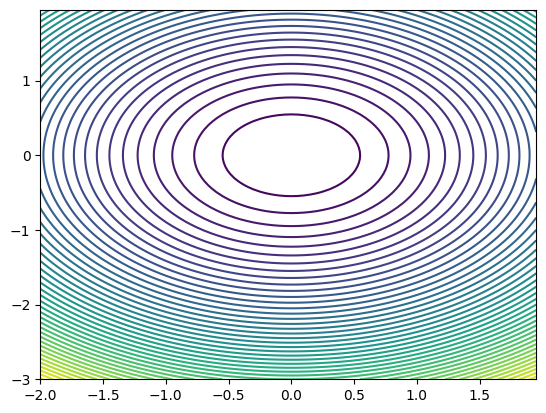

In [24]:
# Function to analyze
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z = X**2 + Y**2

# Contour plot en 2D
plt.figure()
plt.contour(X, Y, Z, 50)

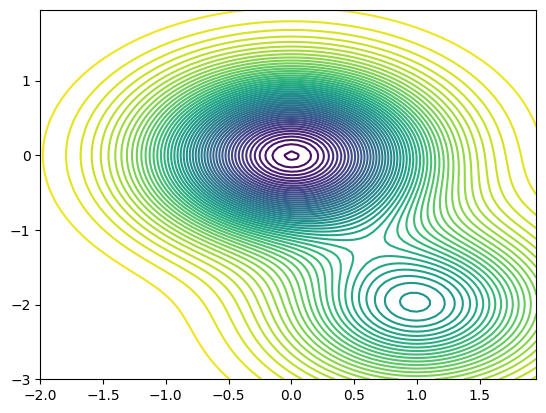

In [25]:
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z =1.5-np.exp(-X**(2)-Y**(2))-0.5*np.exp(-(X-1)**(2)-(Y+2)**(2))
# Contour plot en 2D

plt.figure()
plt.contour(X, Y, Z, 50)

Gradienty funkcji
\begin{equation}
\nabla f(x)=
\begin{bmatrix}
2x_1 \\
2x_2
\end{bmatrix}
\end{equation}

\begin{equation}
\nabla g(x)=
\begin{bmatrix}
2 x_1 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_1-1\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\} \\
2 x_2 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_2+2\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{bmatrix}
\end{equation}

In [30]:
class SimpleGradientDescent:


    def __init__(self,
                 func: Callable[[float, float], float],
                 grad_func: Callable[[float, float], Tuple[float, float]],
                 alpha:float=0.1):
      self.X = np.arange(-2, 2, 0.05)
      self.Y = np.arange(-3, 2, 0.05)
      self.X, self.Y = np.meshgrid(self.X, self.Y)
      self.alpha = alpha
      self.func = func
      self.grad_func = grad_func

    def _calc_Z_value(self):
        self.Z = self.func(self.X, self.Y)

    def plot_func(self, x1, x2, trace:dict={}):
        self._calc_Z_value()
        plt.figure()
        plt.contour(self.X, self.Y, self.Z, 50)
        if len(trace)>0:
            plt.scatter(trace['x'],trace['y'], s=10)
            plt.scatter(trace['x'][-10:],trace['y'][-10:], s=10,color='red')
        plt.title(f'x={x1:.2f}, y={x2:.2f}, alpha = {self.alpha}')

    def calculate_func_value(self, x1:float, x2:float) -> float:
        return self.func(x1, x2)

    def calculate_func_grad(self, x1:float, x2:float) -> Tuple[float, float]:
        return self.grad_func(x1,x2)

    def gradient_descent_step(self, x1:float, x2:float) -> Tuple[float, float]:
        x3, x4 = self.calculate_func_grad(x1, x2)
        return x1-x3*self.alpha, x2-x4*self.alpha

    def minimize(self, x1_init:float, x2_init:float, steps:int, verbose:int=0, plot:bool=False)->float:
      x1 = x1_init
      x2 = x2_init
      trace = {'x':[], 'y':[]}
      for _ in range(steps):
        trace['x'].append(x1)
        trace['y'].append(x2)
        x1,x2 = self.gradient_descent_step(x1, x2)
        if verbose > 0:
          print(f"x1 = {x1} x2 = {x2} ")
      if plot:
        self.plot_func(x1_init, x2_init, trace)
      return self.calculate_func_value(x1,x2)


# Funkcja 1

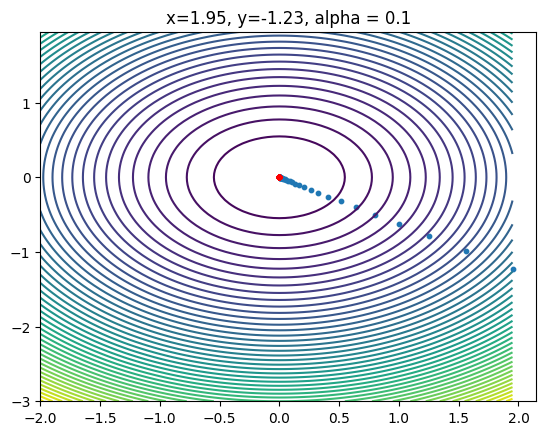

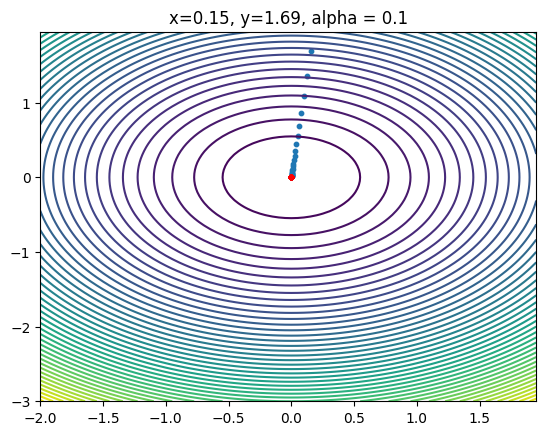

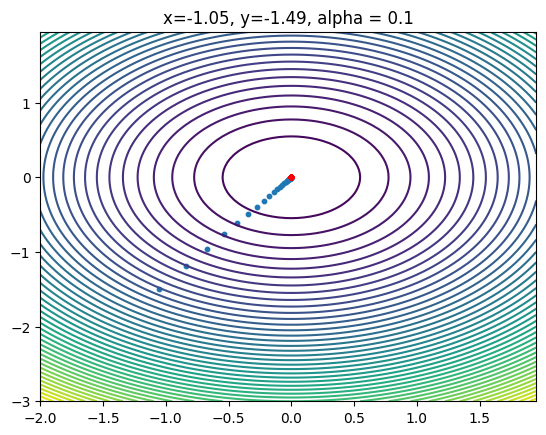

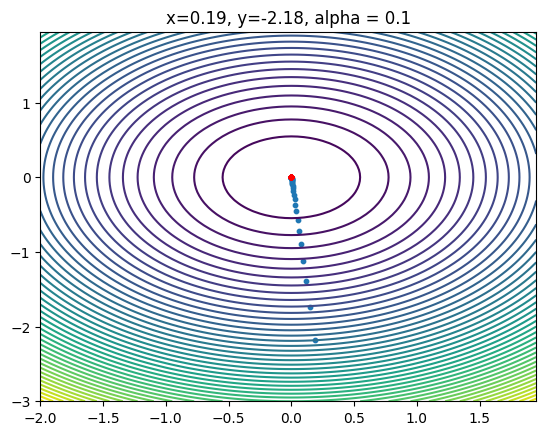

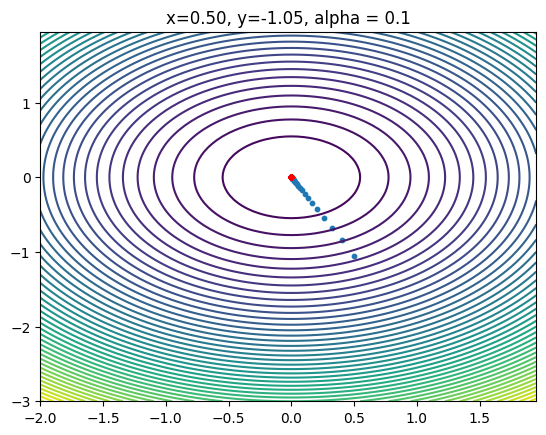

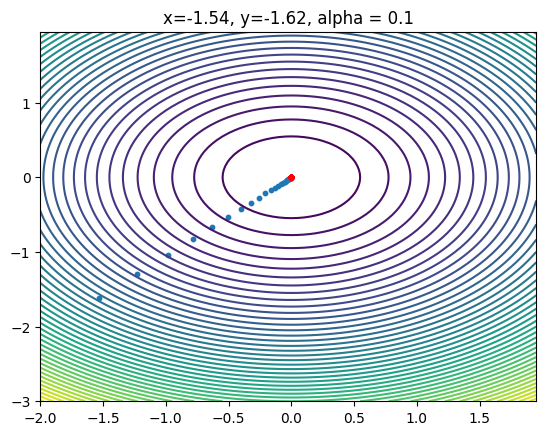

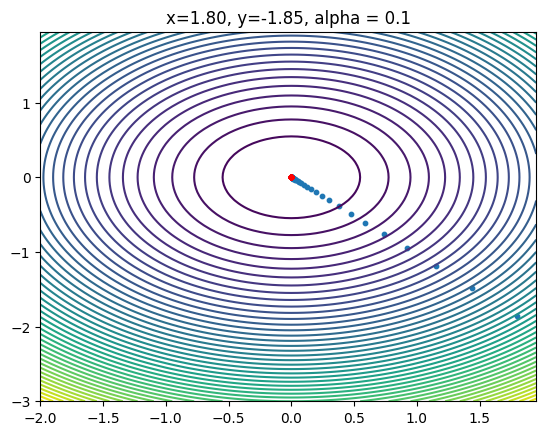

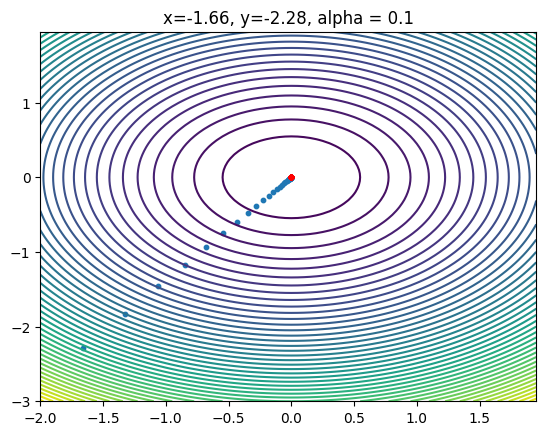

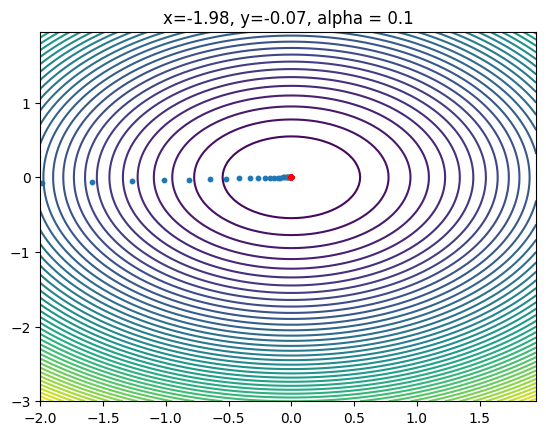

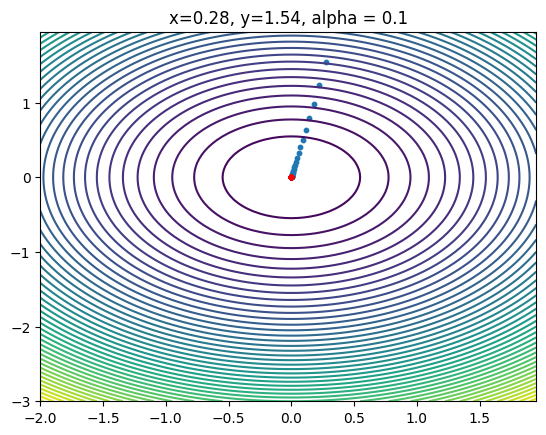

In [31]:
f1 = lambda x,y: x**2+y**2
f1_grad = lambda x,y: (2*x,2*y)
f1_descent = SimpleGradientDescent(f1, f1_grad, alpha = 0.1)

for i in range(10):
  x = random.uniform(-2,2)
  y = random.uniform(-3,2)
  f1_descent.minimize(x, y, 50, plot=True)

###Wnioski
Metoda gradientu prostego bez problemu znajduje minimum globalne w wypadku gdy jest tylko jedno minimum

# Funkcja 2

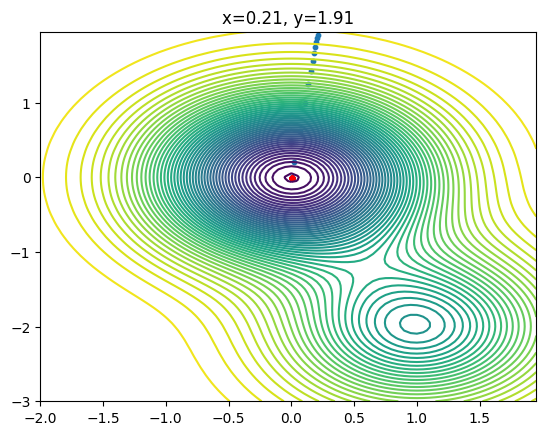

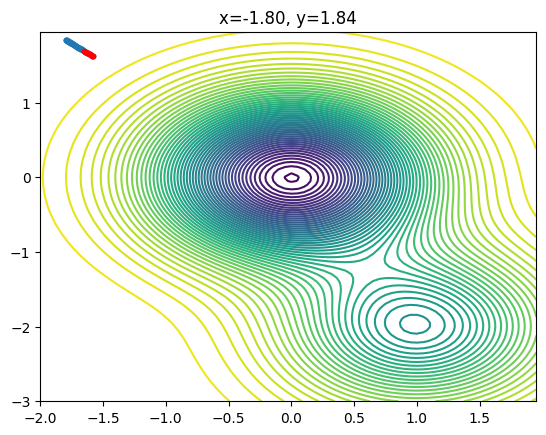

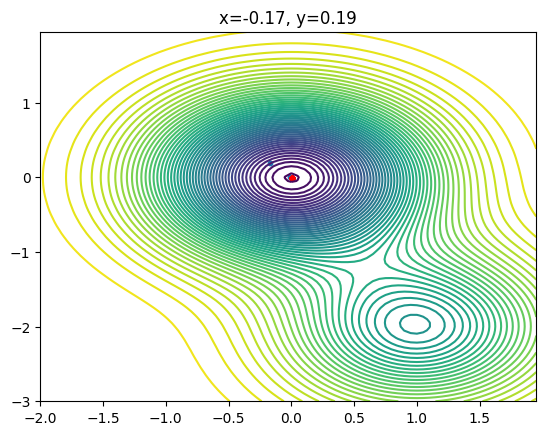

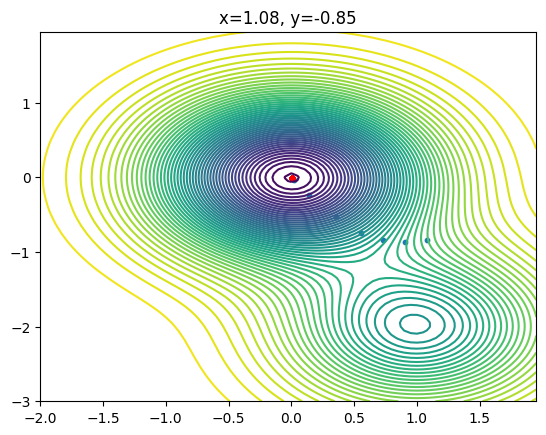

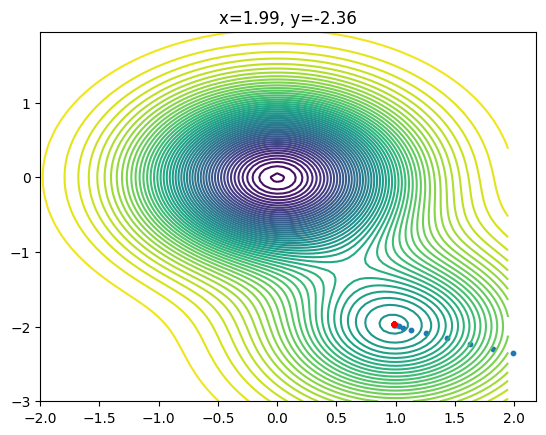

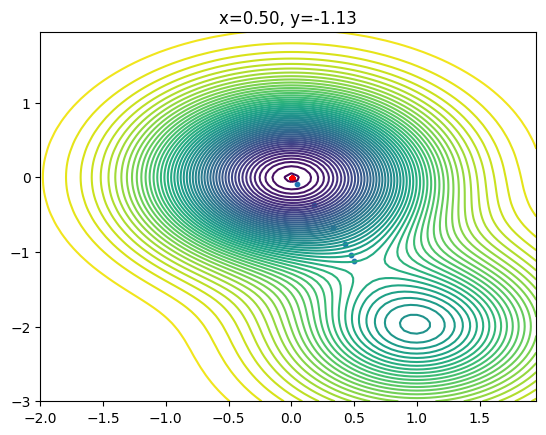

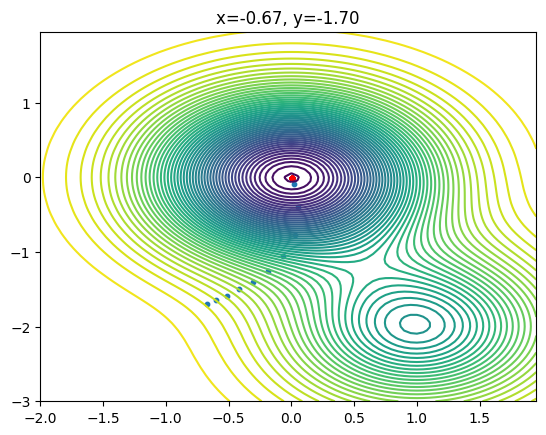

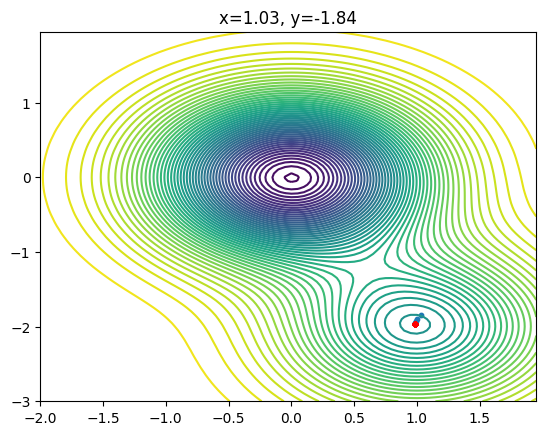

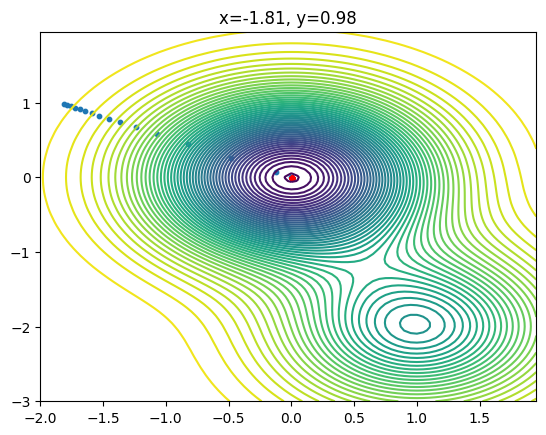

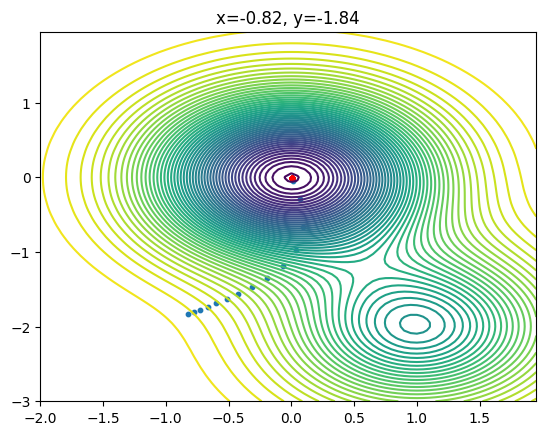

In [28]:
f2 = lambda x,y: 1.5 - np.exp(-x**2-y**2) - 0.5*np.exp(-(x-1)**2-(y+2)**2)
f2_grad = lambda x,y: (2*x*np.exp(-x**2-y**2)+(x-1)*np.exp(-(x-1)**2-(y+2)**2),
                      2*y*np.exp(-x**2-y**2)+(y+2)*np.exp(-(x-1)**2-(y+2)**2))

f2_descent = SimpleGradientDescent(f2, f2_grad, alpha = 0.5)
for i in range(10):
  x = random.uniform(-2,2)
  y = random.uniform(-3,2)
  f2_descent.minimize(x, y, 50, plot=True)



### Wnioski
Metoda gradientu prostego znajduje najbliższe minimum lokalne, a więc czasami też globalne, natomiast gdy punkt startowy znajduje się zadaleko, potrzeba zwiększyć parametr alpha lub steps


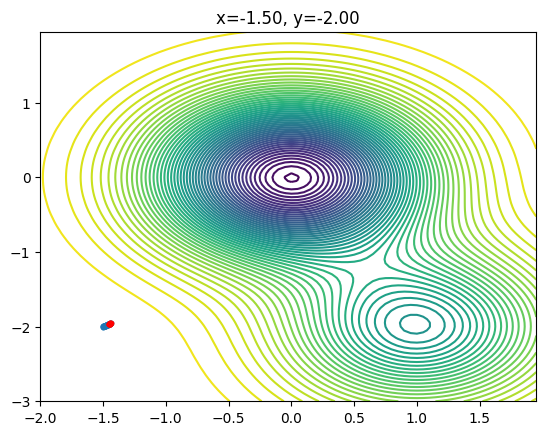

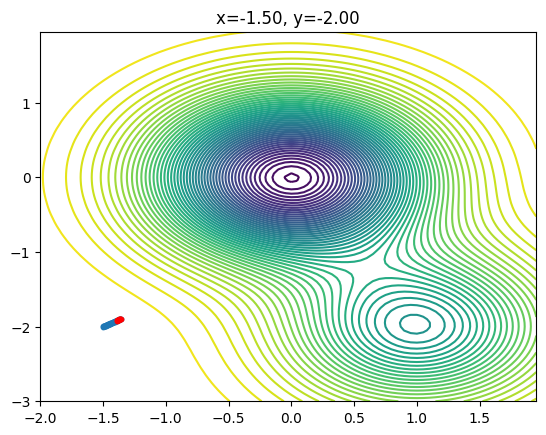

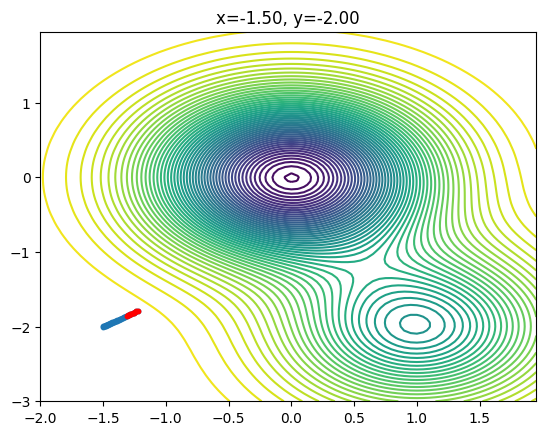

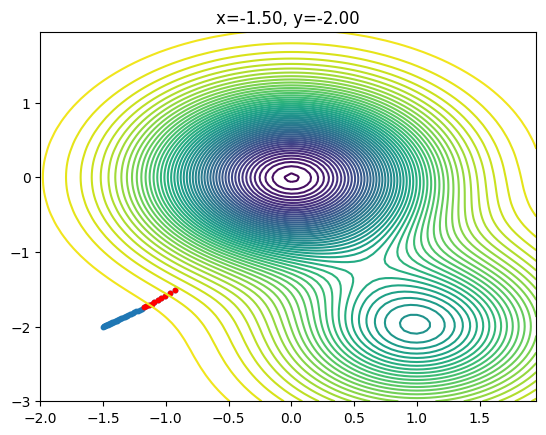

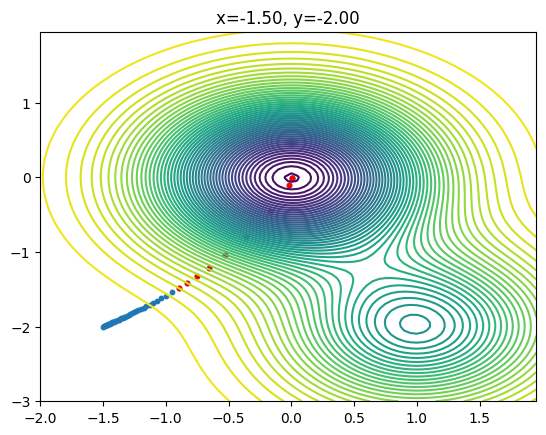

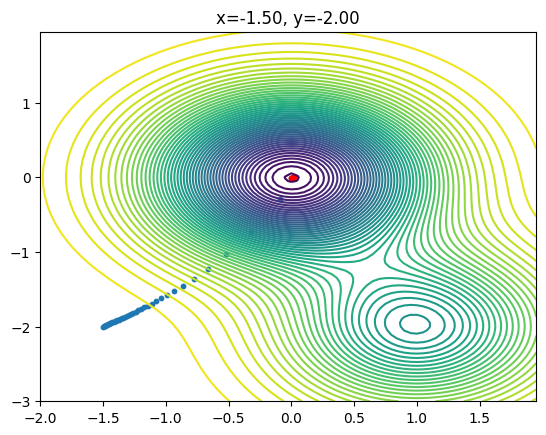

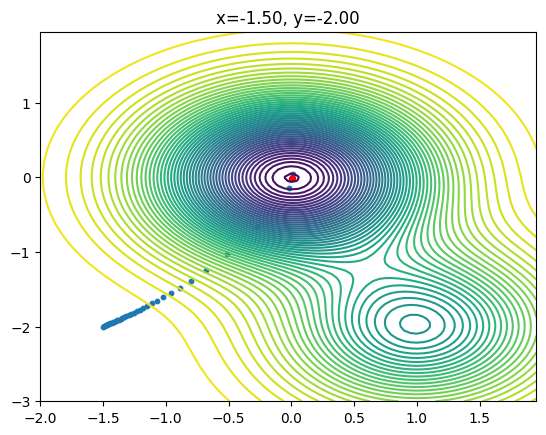

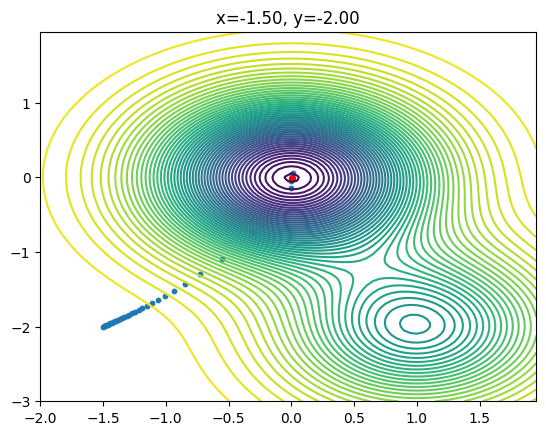

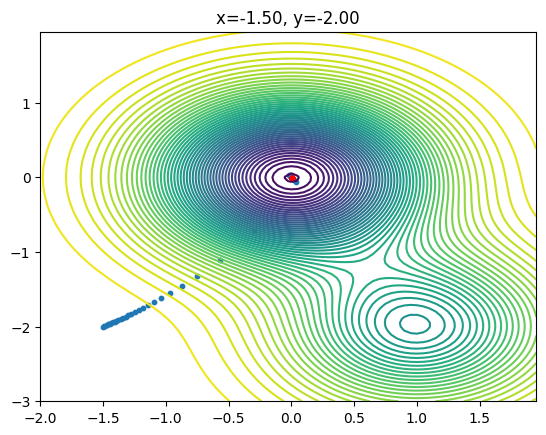

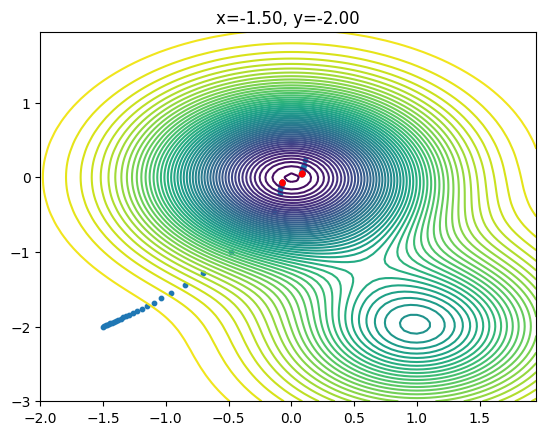

In [29]:
f2 = lambda x,y: 1.5 - np.exp(-x**2-y**2) - 0.5*np.exp(-(x-1)**2-(y+2)**2)
f2_grad = lambda x,y: (2*x*np.exp(-x**2-y**2)+(x-1)*np.exp(-(x-1)**2-(y+2)**2),
                      2*y*np.exp(-x**2-y**2)+(y+2)*np.exp(-(x-1)**2-(y+2)**2))

f2_descent = SimpleGradientDescent(f2, f2_grad, alpha = 0.5)
for i in range(10):
  f2_descent = SimpleGradientDescent(f2, f2_grad, alpha = 0.1+i*0.1)
  x = random.uniform(-2,2)
  y = random.uniform(-3,2)
  f2_descent.minimize(-1.5, -2, 50, plot=True)

W powyższej komórce sprawdzamy wpływ wartości alpha na znajdowanie minimum. Mniejsze wartości nie są wystarczające, aby znaleźć ostateczne minimum, dlatego zwiększamy alphę. Możliwie jest również zwiększenie wartości steps, to też pozwoli na odalazienie ostatecznego minimum.